# Diffumon
**A Denoising Diffusion Probabilistic Model (DDPM) for Image Generation**

This notebook demonstrates checkpoint loading and sample generation.

In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
# Imports
from diffumon.diffusion.sampler import p_sampler_to_images
from diffumon.utils import get_device, load_unet_checkpoint
import PIL
from PIL.Image import Image as PILImage
from IPython.display import display

from diffumon.metrics.plots import combine_images

from pathlib import Path

In [7]:
device = get_device()
gif_samples_path = Path("../samples/gif_samples")
gif_samples_path.mkdir(exist_ok=True, parents=True)

Using device: cuda


In [12]:
# Load Fashion MNIST model
model, noise_schedule, training_summary, chw_dims = load_unet_checkpoint(
    "../checkpoints/pokemon_11k_2048_epochs_3_32_32.pth", device=device
)

Loading trained model from ../checkpoints/pokemon_11k_2048_epochs_3_32_32.pth...
Model loaded.


/home/ladu/Code/DiffuMon/src/diffumon/utils.py:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(f)


<Axes: xlabel='Epoch', ylabel='Avg Batch Loss'>

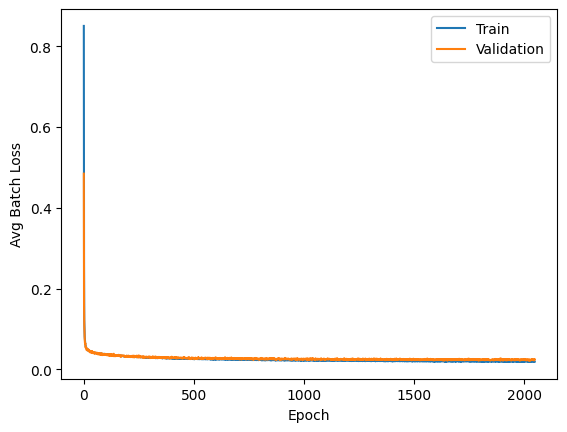

In [13]:
training_summary.plot_train_val_losses()

In [14]:
# Generate samples
print("Generating samples...")
# Each inner lists represents num_samples generated at some timestep t
samples: list[list[PILImage]] = p_sampler_to_images(
    model=model,
    ns=noise_schedule,
    num_samples=48,
    chw_dims=chw_dims,
    seed=1942,
    save_every_k_time_steps=noise_schedule.num_timesteps // 20,
    output_dir=None,
    device=device,
)

Generating samples...


## Show Generated Fashion MNIST samples

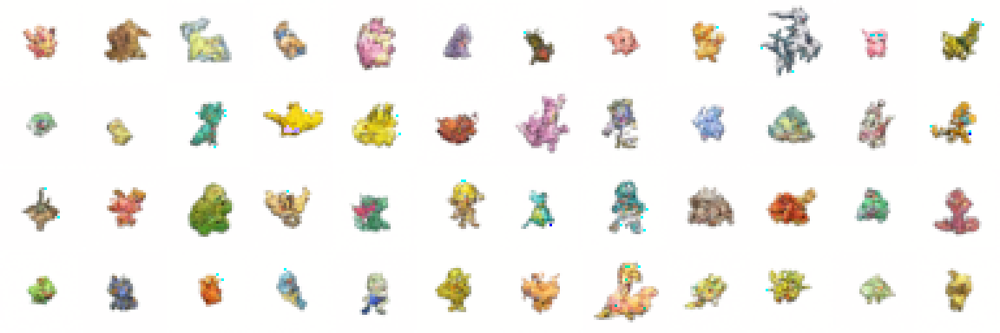

In [15]:
# The last sample is x0. Plot these out
combined = combine_images(samples[-1], rows=4, cols=len(samples[-1]) // 4)

scale = 3
combined = combined.resize(
    (combined.width * scale, combined.height * scale), resample=PIL.Image.BOX
)
# Plot the combined image and display
display(combined)

## Animated gif of the generation process

In [16]:
from diffumon.metrics.plots import animate_images

# Combine images at each recorded timestep
combined_t: list[PILImage] = [ 
    combine_images(samples[ti], rows=4, cols=len(samples[-1]) // 4)
    for ti in range(len(samples))
]

scale = 3
# Resize images
combined_t = [
    img.resize((img.width * scale, img.height * scale), resample=PIL.Image.BOX)
    for img in combined_t
]

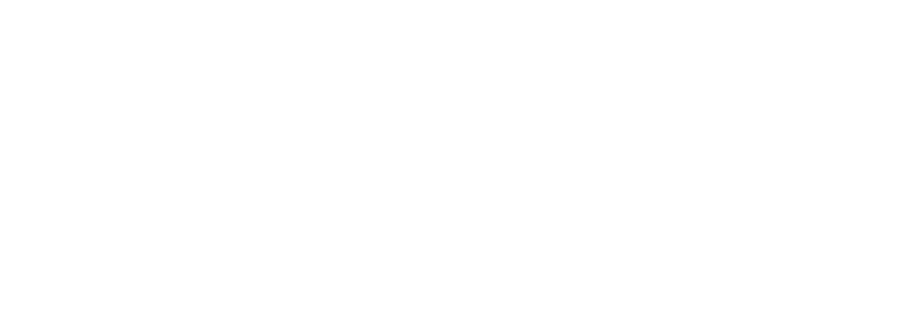

In [17]:
# Animate the combined images
ani = animate_images(combined_t)

# (Optional) Save the gif
gif_path = gif_samples_path / "pokemon_diffusion.gif"
ani.save(gif_path)

In [18]:
# Play the gif
from IPython.display import HTML


HTML(ani.to_jshtml(default_mode="once"))